# Liberal Democrat UBI Policy Paper: An Analysis

Last month, the Liberal Democrat UBI Working Group published a [policy paper](https://d3n8a8pro7vhmx.cloudfront.net/libdems/pages/1811/attachments/original/1621669347/145_-_Universal_Basic_Income.docx_%281%29.pdf?1621669347) exploring possible universal basic income policies for the party’s platform. This release follows the [September Liberal Democrat Conference vote](https://www.libdems.org.uk/a20-ubi) to campaign for universal basic income in future elections. The findings from the Working Group’s paper were presented by Paul Noblet, the chair, in the [recorded Social Liberal Forum event](https://www.socialliberal.net/what_kind_of_ubi_recording) What Kind of UBI?, in which Jane Dodds (Leader of the Liberal Democrats in Wales), Christine Jardine (Liberal Democrat MP for Edinburgh West) and Max Ghenis (Founder of the UBI Center) gave first responses to the proposals. The working group invites comments on the paper until 7th June.

In this post, I apply the open-sourced microsimulation model [OpenFisca-UK](https://github.com/PSLmodels/openfisca-uk) to assess the four UBI reforms described in the paper, which are partly offset by tax and benefit reforms. I find that each would reduce poverty by a sixth and deep poverty by half, while benefiting 7 in 10 Britons, though they would also add at least £20 billion to the annual deficit.

## Policy outlines

The details of the four reforms are shown in the table below. The reforms are mainly funded by tax changes, and recover additional costs through the benefit system. See Appendix A for more details and a comparison to estimates in the Liberal Democrat discussion paper.

In [1]:
import pandas as pd

pd.DataFrame({
    "UBI amount (£/week)": [45, 60, 75, 90],
    "Personal Allowance (£/year)": [4000, 2500, 2500, 2500],
    "NI Primary Threshold (£/week)": [90, 50, 50, 50],
    "Eligible groups": ["Working-age adults"] * 4,
    "UBI in benefit means tests": ["Included"] * 4
}).set_index("UBI amount (£/week)")

,Personal Allowance (£/year),NI Primary Threshold (£/week),Eligible groups,UBI in benefit means tests
UBI amount (£/week),,,,
45,4000,90,Working-age adults,Included
60,2500,50,Working-age adults,Included
75,2500,50,Working-age adults,Included
90,2500,50,Working-age adults,Included


### Tax changes

The Liberal Democrat UBI Working Group (LDUWG) proposes two changesto fund the UBI expenditure: reducing the Personal Allowance (for working-age adults only) and reducing the National Insurance Primary Threshold.
The Personal Allowance is a disregard for general income available to every individual with respect to Income Tax. In 2020, it had the value of £12,500 a year. For example, for an individual earning £22,500 a year, the Personal Allowance is deducted from taxable income to arrive at £10,000, which is taxed at the basic rate of 20%, resulting in a tax charge of £2,000. Reducing the Personal Allowance to £2,500 leaves the individual with £20,000 taxable income, resulting in a £4,000 Income Tax charge.  The LDUWG proposes lowering the Personal Allowance to £4,000 for the UBI of £45/week, and to £2,500 for the UBIs of £60, £75, and £90 per week.[^1]
National Insurance (NI) is a tax paid on employment earnings, comprising both employee and employer contributions. The LDUWG proposed increasing employee NI contributions by reducing the Primary Threshold. The threshold is currently set at £184/week: earnings under this are not taxed, earnings above this but under the Upper Earnings Limit (UEL, currently £967/week) are taxed at 12%, and earnings over the UEL are taxed at 2%. Lowering the Primary Threshold raises taxes in a similar way to the Personal Allowance reduction, but behaves differently due to the difference between an allowance and a threshold. Lowering an allowance by £1 effectively moves all thresholds down by £1, but lowering a threshold only moves that specific threshold.

[^1]: The higher allowance and threshold in the first reform increases the net cost by around £8bn.

### UBI and benefit changes

The LDUWG proposes the basic income to working-age adults: individuals aged between 18 (inclusive) and the State Pension age (exclusive). This takes the form of a weekly payment in the amounts detailed below. No immediate changes or abolitions of existing benefit programs are proposed in the UBI policies. However, UBI payments would be taken into account and treated as earnings when existing benefits are means-tested: for example, if a person receives £70/week from Universal Credit and then is paid £60/week in UBI, their Universal Credit payment would be reduced at the 63% taper (assuming work allowances, set amounts of income disregarded by means tests, are exhausted) to arrive at £32.20 (which, combined with the £60 UBI, results in £93.20 - an increase of 33%).

## Reform effects

All four of the reforms reduce poverty and inequality, and leave most better off. Their net costs range from £22bn  for the £45 UBI (about the cost of Housing Benefit) to £101bn for the £90 UBI (about the cost of State Pension). The below table shows the effects on the budget, as well as to poverty (before housing costs), deep poverty (defined at half the poverty line) and inequality (measured by the Gini coefficient of disposable income).

In [2]:
from openfisca_uk import Microsimulation
from reform import WA_adult_UBI, include_UBI_in_means_tests, set_PA, set_PA_for_WA_adults, set_PT, net_cost
import numpy as np
import pandas as pd
from tqdm import trange, tqdm

baseline = Microsimulation(year=2020)
funding = (set_PA_for_WA_adults(2500), set_PT(50), include_UBI_in_means_tests())
ubi_45 = (WA_adult_UBI(45 * 52), set_PA_for_WA_adults(4000), set_PT(90), include_UBI_in_means_tests())
ubi_60 = (WA_adult_UBI(60 * 52), *funding)
ubi_75 = (WA_adult_UBI(75 * 52), funding)
ubi_95 = (WA_adult_UBI(95 * 52), funding)

net_costs = []
component_names = ["UBI", "Lower PA", "Lower PT", "Reduced benefits"]
for i in range(len(ubi_60) + 1):
    net_costs += [net_cost(baseline, Microsimulation(ubi_60[:i], year=2020))]
net_costs = np.array(net_costs)

resulting_costs = pd.Series(net_costs[1:] - net_costs[:-1])
resulting_costs = resulting_costs.apply(lambda x : round(x / 1e+9, 1))


from openfisca_uk.api import *

def get_results(reform: Reform):
    sim = Microsimulation(reform, year=2020)
    cost = net_cost(baseline, sim)
    ubi_cost = sim.calc("UBI").sum()
    reform_tax_revenue = sim.calc("tax").sum() - baseline.calc("tax").sum()
    benefit_revenue = ubi_cost - reform_tax_revenue - cost
    baseline_poverty = baseline.calc("in_poverty_bhc", map_to="person").mean()
    baseline_deep_poverty = baseline.calc("in_deep_poverty_bhc", map_to="person").mean()
    poverty_change = (sim.calc("in_poverty_bhc", map_to="person").mean() - baseline_poverty) / baseline_poverty
    deep_poverty_change = (sim.calc("in_deep_poverty_bhc", map_to="person").mean() - baseline_deep_poverty) / baseline_deep_poverty
    baseline_gini = baseline.calc("household_net_income", map_to="person").gini()
    inequality_change = (sim.calc("household_net_income", map_to="person").gini() - baseline_gini) / baseline_gini
    baseline_income = baseline.calc("household_net_income", map_to="person")
    gain = sim.calc("household_net_income", map_to="person") - baseline_income
    percent_winners = (gain > 0).mean()
    percent_losers = (gain < 0).mean()
    return sim, cost, poverty_change, deep_poverty_change, inequality_change, percent_winners, percent_losers, ubi_cost, benefit_revenue, reform_tax_revenue

reforms = (ubi_45, ubi_60, ubi_75, ubi_95)
names = ("£45", "£60", "£75", "£95")
results = list(map(get_results, reforms))
sims, costs, poverty_changes, deep_poverty_changes, inequality_changes, percent_winners, percent_losers, ubi_cost, benefit_revenue, reform_tax_revenue = list(zip(*results))
LD_lower = (13, 22, 48, 84)
LD_upper = (18, 28, 56, 93)
pd.DataFrame({
    "UBI (£/week)": names, 
    "Net cost (£bn)": pd.Series(costs).apply(lambda x: round(x / 1e+9, 1)), 
    "Poverty change (%)": pd.Series(poverty_changes).apply(lambda x: round(x * 100, 1)),
    "Deep poverty change (%)": pd.Series(deep_poverty_changes).apply(lambda x: round(x * 100, 1)),
    "Inequality change (%)": pd.Series(inequality_changes).apply(lambda x : round(x * 100, 1)),
    "Winners (%)": pd.Series(percent_winners).apply(lambda x : round(x * 100, 1)),
    "Losers (%)": pd.Series(percent_losers).apply(lambda x : round(x * 100, 1))
}).set_index("UBI (£/week)")

,Net cost (£bn),Poverty change (%),Deep poverty change (%),Inequality change (%),Winners (%),Losers (%)
UBI (£/week),,,,,,
£45,21.8,-17.0,-50.5,-2.8,69.9,16.2
£60,34.3,-21.8,-62.6,-3.5,71.7,14.8
£75,62.7,-30.1,-71.4,-4.4,81.2,5.5
£95,100.7,-38.5,-77.6,-5.4,85.9,0.8


### Funding breakdown

Below specifies the second reform, and calculates the effects of each component under the household-level simulation. This is a £60/week UBI for working-age adults, funded in part by including it in benefit means tests[^2], reducing the Personal Allowance for working-age adults and reducing the National Insurance Primary Threshold to £50/week. Overall, the Personal Allowance provides most of the funding, and the inclusion in means tested benefits provides only a small part that could be covered by reducing the personal allowance further.

[^2]: Universal Credit, Tax Credits, Housing Benefit and Income Support simulated. The UBI is treated as earned income, rather than as unearned income.

In [3]:
pd.DataFrame({"Component": component_names, "Net cost (£bn)": resulting_costs, "Resulting net cost (£bn)": resulting_costs.cumsum()}).set_index("Component")

,Net cost (£bn),Resulting net cost (£bn)
Component,,
UBI,126.9,126.9
Lower PA,-60.7,66.2
Lower PT,-19.1,47.1
Reduced benefits,-12.8,34.3


### Distributional effects

#### Inter-decile effects

The above effects only show the picture on the population as a whole. Below shows the average gain to members of the population by their household's equivalised disposable income. With deficit funding, the plans are able to show positive impacts on average for every decile in every reform. Raising taxes to fund these proposals would likely create average losses for the higher deciles if the tax rises are progressive.

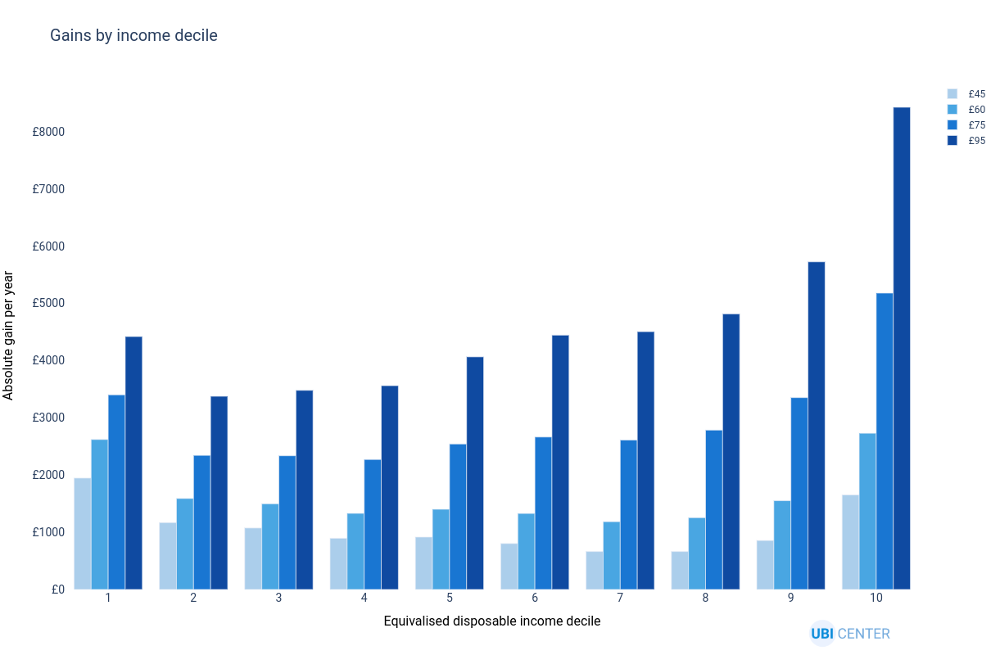

In [4]:
import plotly.graph_objects as go
from ubicenter import format_fig

fig = go.Figure()

income = baseline.calc("equiv_household_net_income", map_to="person")

LIGHTER_BLUE = "#ABCEEB"  # Blue 100.
LIGHT_BLUE = "#49A6E2"  # Blue 700.
BLUE = "#1976D2"  # Blue 700.
DARK_BLUE = "#0F4AA1"  # Blue 900.

BLUE_COLORS = [LIGHTER_BLUE, LIGHT_BLUE, BLUE, DARK_BLUE]

for sim, name, color in zip(sims, names, BLUE_COLORS):
    gain = sim.calc("household_net_income", map_to="person") - baseline.calc("household_net_income", map_to="person")
    result = gain.groupby(income.decile_rank()).mean()
    fig.add_trace(go.Bar(x=result.index, y=result.values, name=name, marker_color=color))

format_fig(fig.update_layout(title="Gains by income decile", xaxis_tickvals=list(range(1, 11)), xaxis_title="Equivalised disposable income decile", yaxis_title="Absolute gain per year", yaxis_tickprefix="£"))

#### Intra-decile effects

While the gains at the bottom of the income distribution are typically strong, the reforms are not particularly punitive on the top deciles (only 31% of the top three deciles lose income), which is to be expected given that the tax rises are limited to lower sections of income and, though to a smaller effect, changing the Personal Allowance explicitly does not affect those earning over £125,000 as it is phased out by this point. Below shows the distribution of outcomes for each decile, for each reform, including all individuals in the population.

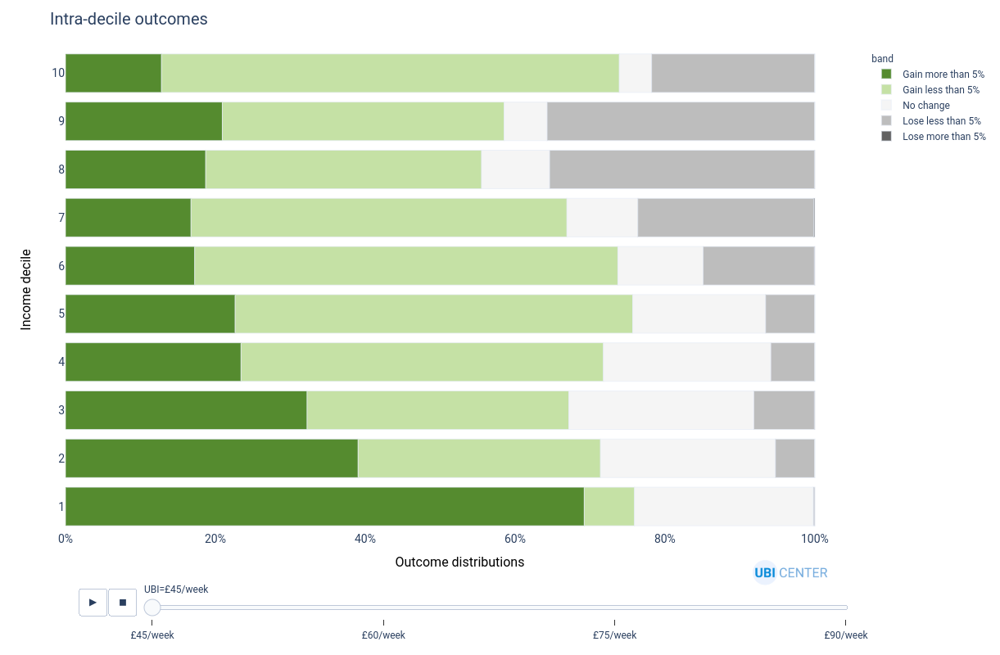

In [5]:
import plotly.express as px
from charts import intra_decile_graph_data

intra = intra_decile_graph_data(baseline, *sims)

COLORS = (
        "#616161",
        "#BDBDBD",
        "#F5F5F5",
        "#C5E1A5",
        "#558B2F",
    )[::-1]

format_fig(px.bar(intra, x="fraction", y="decile", orientation="h", color="band", animation_frame="UBI", color_discrete_sequence=COLORS).update_layout(
    yaxis_tickvals=list(range(1, 11)), 
    xaxis_tickformat="%", 
    yaxis_title="Income decile",
    xaxis_title="Outcome distributions",
    title="Intra-decile outcomes"
))

## Individual effects

The above results show the impact on the population as it stands, but not the theoretical effects on household budgets. An individual living alone and who will claim Universal Credit sees their disposable income increased by the £45/week UBI reform at earnings under £30,000 and over £70,000.

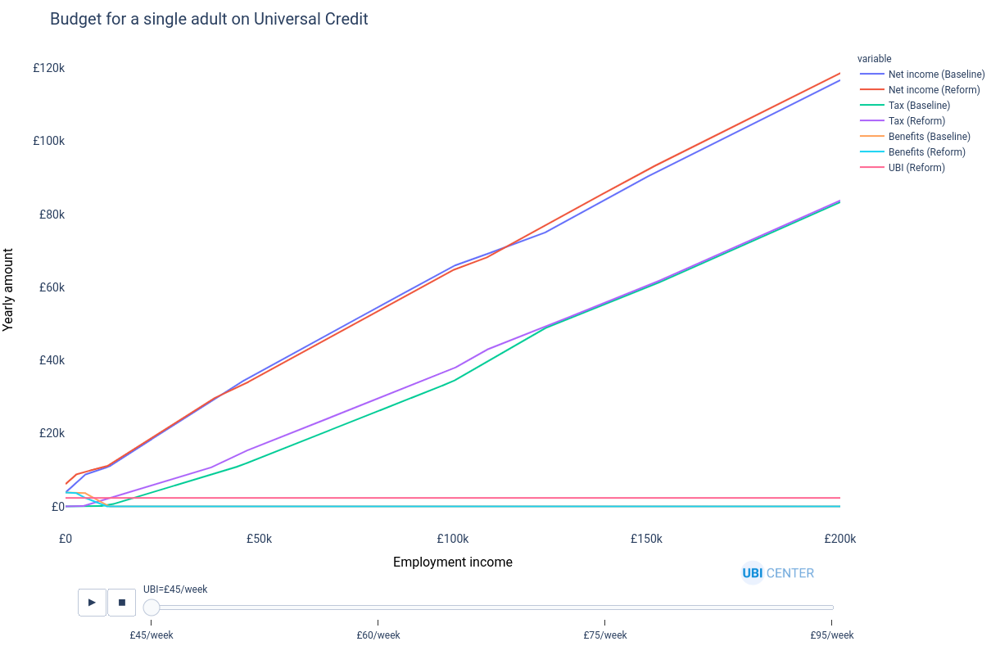

In [6]:
from openfisca_uk import IndividualSim
from ubicenter import format_fig

def plot_budget(household_config, title):
    baseline_policy = IndividualSim()
    household_config(baseline_policy)
    baseline_policy.vary("employment_income")
    employment_income = baseline_policy.calc("employment_income")[0]
    budget_dfs = []
    for reform, name in zip((ubi_45, ubi_60, ubi_75, ubi_95), (45, 60, 75, 95)):
        ubi_policy = IndividualSim(reform)
        household_config(ubi_policy)
        ubi_policy.vary("employment_income")
        df = pd.DataFrame({
            "Net income (Baseline)": baseline_policy.calc("household_net_income")[0],
            "Net income (Reform)": ubi_policy.calc("household_net_income")[0],
            "Tax (Baseline)": baseline_policy.calc("tax")[0],
            "Tax (Reform)": ubi_policy.calc("tax")[0],
            "Benefits (Baseline)": baseline_policy.calc("benefits")[0],
            "Benefits (Reform)": ubi_policy.calc("benefits")[0],
            "UBI (Reform)": ubi_policy.calc("UBI")[0],
            "Employment income": employment_income,
        })
        df["UBI"] = f"£{name}/week"
        budget_dfs += [df]
    
    return format_fig(px.line(
        pd.concat(budget_dfs), 
        x="Employment income", 
        y=["Net income (Baseline)", "Net income (Reform)", "Tax (Baseline)", "Tax (Reform)", "Benefits (Baseline)", "Benefits (Reform)", "UBI (Reform)"], 
        animation_frame="UBI"
    ).update_layout(
        title=title,
        yaxis_tickprefix="£",
        xaxis_tickprefix="£",
        yaxis_title="Yearly amount",
        xaxis_title="Employment income",        
    ))

def single_person_UC(sim):
    sim.add_person(age=26, is_benunit_head=True, name="adult"),
    sim.add_benunit(adults=["adult"], claims_UC=True),
    sim.add_household(adults=["adult"])

plot_budget(single_person_UC, "Budget for a single adult on Universal Credit")

### Appendix A: Costing estimates

The Working Group used different modelling methods than were used in this analysis, resulting in our analysis producing higher net costs than the Working Group found. This is primarily due to the fact that this analysis used a household simulation method, rather than administrative data from HMRC. This allows for finer levels of detail and distributional analysis, but high incomes and benefit receipts are under-reported, causing an underestimate of the revenue raised by the tax reforms. The details are shown in the table below.

In [7]:
LD_lower = (13, 22, 48, 84)
LD_upper = (18, 28, 56, 93)
pd.DataFrame({
    "UBI (£/week)": names, 
    "LD net cost (£bn)": [f"{low}-{high}" for low, high in zip(LD_lower, LD_upper)], 
    "Simulated net cost (£bn)": pd.Series(costs).apply(lambda x: round(x / 1e+9, 1)), 
    "UBI cost": pd.Series(ubi_cost).apply(lambda x: round(x / 1e+9, 1)),
    "Tax revenue": pd.Series(reform_tax_revenue).apply(lambda x: round(x / 1e+9, 1)),
    "Reduced benefits": pd.Series(benefit_revenue).apply(lambda x: round(x / 1e+9, 1)),
    "Difference from central estimate (£bn)": [round((c - (low + high) / 2 * 1e+9) / 1e+9, 1) for c, low, high in zip(costs, LD_lower, LD_upper)],
}).set_index("UBI (£/week)")

,LD net cost (£bn),Simulated net cost (£bn),UBI cost,Tax revenue,Reduced benefits,Difference from central estimate (£bn)
UBI (£/week),,,,,,
£45,13-18,21.8,95.1,67.8,5.5,6.3
£60,22-28,34.3,126.9,85.3,7.3,9.3
£75,48-56,62.7,158.6,85.3,10.5,10.7
£95,84-93,100.7,200.9,85.3,14.9,12.2


Thanks to Kevin Langford, who provided more details on the policy proposal not present in the discussion paper, and on the modelling approaches that produced the cost estimates. The LDUWG paper mirrors proposals in Langford's paper, [<i>Money for Nothing?</i>](https://radixuk.org/papers/money-for-nothing/), published in May 2021 with Radix.

### Appendix B: Relationships between employment and net income for other household types

Below is a selection of the theoretical effects on different household types.

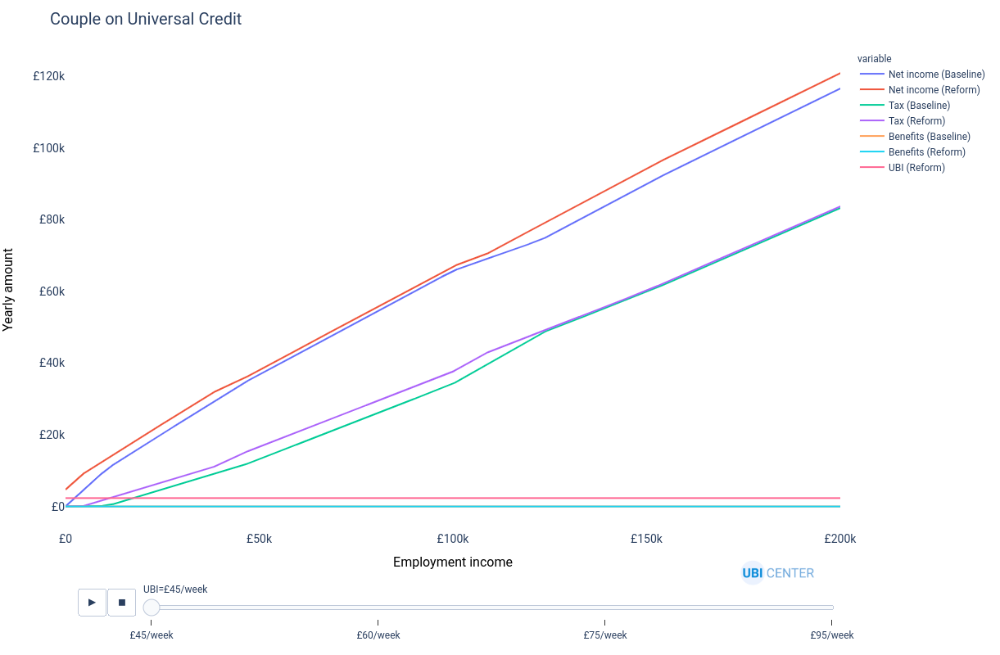

In [8]:
def couple_UC(sim):
    sim.add_person(age=26, is_benunit_head=True, name="adult"),
    sim.add_person(age=27, is_benunit_head=False, name="adult2"),
    sim.add_benunit(adults=["adult", "adult2"]),
    sim.add_household(adults=["adult", "adult2"])
    
plot_budget(couple_UC, "Couple on Universal Credit")

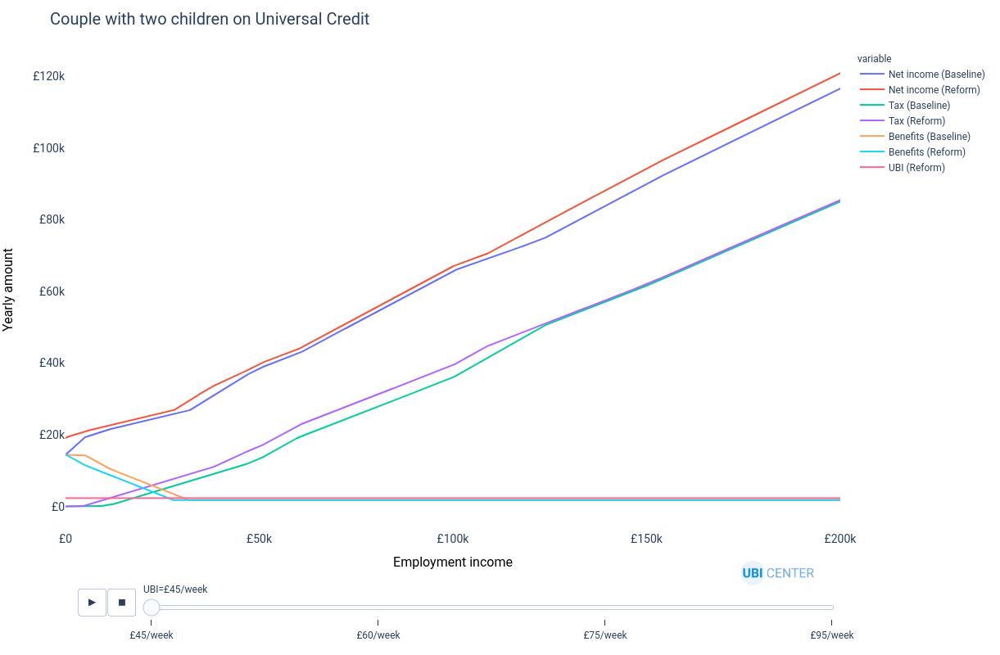

In [9]:
def couple_children_UC(sim):
    sim.add_person(age=26, is_benunit_head=True, name="adult"),
    sim.add_person(age=27, name="adult2"),
    sim.add_person(age=3, name="child"),
    sim.add_person(age=4, name="child2"),
    sim.add_benunit(adults=["adult", "adult2"], children=["child", "child2"], claims_UC=True, claims_child_benefit=True)
    sim.add_household(adults=["adult", "adult2"], children=["child", "child2"])
    
plot_budget(couple_children_UC, "Couple with two children on Universal Credit")